In [1]:
import logging
import shlex
import sys
from pathlib import Path
from typing import Dict, Tuple, Union

import elettra_toolbox
from elettra_toolbox import ScanConfig
from cpymad.madx import Madx

LOGGER = logging.getLogger(name=__name__)
LOGGER.setLevel(logging.DEBUG)

handler = logging.StreamHandler(sys.stdout)
handler.setLevel(logging.DEBUG)
LOGGER.addHandler(handler)

import os
from typing import Tuple

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
import scipy
from matplotlib import cm, gridspec, patches
from pyhdtoolkit import cpymadtools

plt.rcParams.update({"text.usetex": False})

In [2]:
if os.path.exists("stdout.out"):
    os.remove("stdout.out")

# Launch MAD-X Session
with open("stdout.out", "w") as f:
    madx = Madx(stdout=f)

# Read parameters

from config import parameters, settings

for i in parameters.keys():
    madx.globals[i] = parameters[i]

# Call sequence and optics

madx.call("elettra2_v15_VADER_2.3T.madx")
madx.call("optics_elettra2_v15_VADER_2.3T.madx")

# Initial twiss

madx.use(sequence="ring")
madx.twiss(sequence="ring", table="init_twiss")

# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

twiss = madx.table.init_twiss.dframe()


# Let's install some markers

madx.input(
    """
left_marker: marker;
right_marker: marker;
middle_marker: marker;

use, sequence=ring;
seqedit, sequence=ring;
flatten;
install, element=left_marker, at=10.8;
install, element=middle_marker, at=21.6;
install, element=right_marker, at=32.4;
flatten;
endedit;
"""
)

madx.use(sequence="ring")
madx.twiss(sequence="ring")
twiss = madx.table.twiss.dframe()

Emittance x : 1031.9436 pm


In [3]:
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

2021-10-22 15:07:05.105 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:07:05.106 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:07:05.569 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:07:05.633 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:07:06.791 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:07:06.807 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:07:06.828 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate
2021-10-22 15:07:06.830 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:695 - Savin

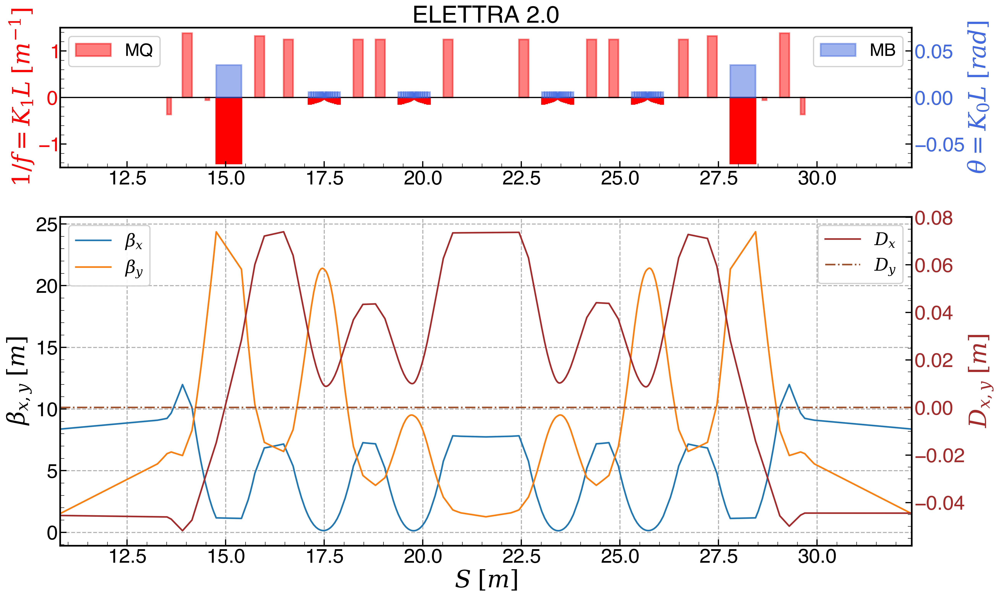

In [4]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
    savefig="raw_no_AB.pdf",
)

In [5]:
# Dispersion matching using the AB

madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf1, step=1e-6;
vary, name=k1_bqf2, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

print(madx.globals.tar)

4.501790152049615e-23


2021-10-22 15:07:17.646 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:07:17.647 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:07:18.114 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:07:18.176 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:07:19.469 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:07:19.485 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:07:19.507 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


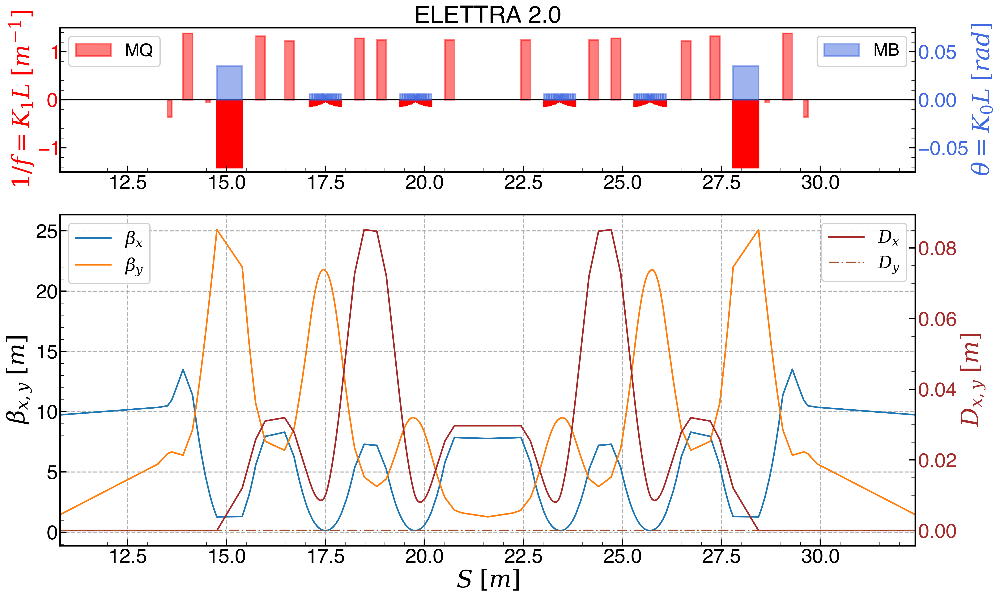

In [6]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [9]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1211.7887 pm


At this point, scanning the k1 of BF1 is pointless (tried and no results). Let's check the 2 other AB...

In [10]:
# Scan BQF3

init_k1_bqf3 = 5.191616161616161
delta_k1_bqf3 = 1
n_points = 100

k1_bqf3_scan = ScanConfig("k1_bqf3", initial_value=init_k1_bqf3, scan_start=init_k1_bqf3-delta_k1_bqf3, 
                         scan_end=init_k1_bqf3+delta_k1_bqf3, n_points=n_points)

In [11]:
%%time
emit_res = elettra_toolbox.scan_param_for_emittance(madx, k1_bqf3_scan, 'stdout.out')

Scanning parameter k1_bqf3 for emittance results.
Attempting emittance calculation for value of 4.19162
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.21182
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.23202
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.25222
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.27242


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.29263
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.31283
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.33303
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.35323


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.37343
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.39364
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.41384
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.43404


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.45424
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.47444
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.49465
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.51485


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.53505
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Attempting emittance calculation for value of 4.55525
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.57545
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.59566
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.61586
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.63606
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.65626
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.67646
Running survey o

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Attempting emittance calculation for value of 5.44414
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.46434
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.48455
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.50475
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.52495
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.54515
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.56535
Twiss failed for this configuration, defaulting to NaN and skipping 

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.68657
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.70677
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.72697
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.74717
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.76737
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.78758
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.80778
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance c

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ E

Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.88859
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.90879
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.92899
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.94919
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.96939
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.98960
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.00980
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance c

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ E

Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.07040
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.09061
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.11081
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.13101
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.15121
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.17141
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.19162
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
CPU times: user 452 ms

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


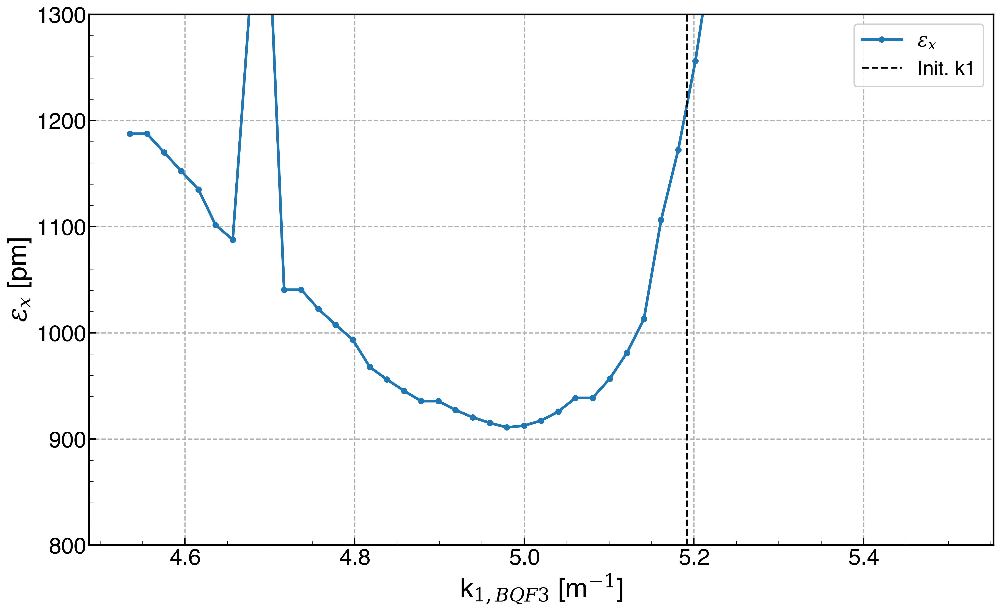

In [12]:
plt.plot(emit_res.index.to_numpy(), emit_res['ex']*1e12, '-o', lw=3, label='$\\epsilon_x$')
plt.axvline(x=init_k1_bqf3, ls='--', c='k', lw=2, label='Init. k1')
plt.legend(loc='best')
plt.ylim(800,1300)
plt.xlabel('k$_{1, BQF3}$ [m$^{-1}$]')
plt.ylabel('$\\epsilon_x$ [pm]');

In [13]:
# Let's set k1_bqf3 for the best emittance value

k1_bqf3_min_emit = emit_res['ex'].idxmin()

madx.globals.k1_bqf3 = k1_bqf3_min_emit
madx.command.twiss()
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

In [14]:
# And let's scan BQF4

init_k1_bqf4 = 5.191616161616161
delta_k1_bqf4 = 1
n_points = 100

k1_bqf4_scan = ScanConfig("k1_bqf4", initial_value=init_k1_bqf4, scan_start=init_k1_bqf4-delta_k1_bqf4, 
                         scan_end=init_k1_bqf4+delta_k1_bqf4, n_points=n_points)

In [15]:
%%time
emit_res = elettra_toolbox.scan_param_for_emittance(madx, k1_bqf4_scan, 'stdout.out')

Scanning parameter k1_bqf4 for emittance results.
Attempting emittance calculation for value of 4.19162
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.21182
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.23202
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.25222
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.27242


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.29263
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.31283
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Attempting emittance calculation for value of 4.33303
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.35323
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.37343
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.39364
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.41384
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.43404
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.45424
Running survey o

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Attempting emittance calculation for value of 5.72697
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.74717
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.76737
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.78758
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.80778
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.82798
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 5.84818
Twiss failed for

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.92899
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.94919
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.96939
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.98960


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.00980
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.03000
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.05020
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.07040
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.09061
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.11081


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.13101
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.15121
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.17141
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 6.19162
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
CPU times: user 753 ms, sys: 184 ms, total: 937 ms
Wall time: 21.9 s


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


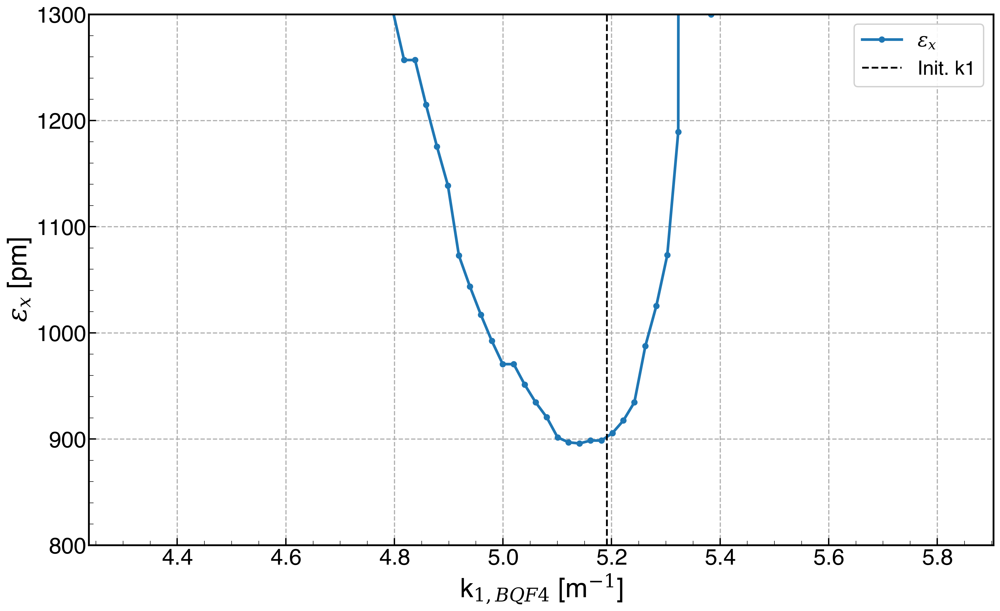

In [17]:
plt.plot(emit_res.index.to_numpy(), emit_res['ex']*1e12, '-o', lw=3, label='$\\epsilon_x$')
plt.axvline(x=init_k1_bqf4, ls='--', c='k', lw=2, label='Init. k1')
plt.legend(loc='best')
plt.ylim(800,1300)
plt.xlabel('k$_{1, BQF4}$ [m$^{-1}$]')
plt.ylabel('$\\epsilon_x$ [pm]');

No clear improvement seens... Let's set k1_bqf4 back to its value

In [18]:
# Let's set k1_bqf4 for the best emittance value

madx.globals.k1_bqf4 = init_k1_bqf4
madx.command.twiss()
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

In [20]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 910.8942199999999 pm


2021-10-22 15:10:28.968 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:10:28.969 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:10:29.443 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:10:29.505 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:10:30.953 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:10:30.969 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:10:30.989 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


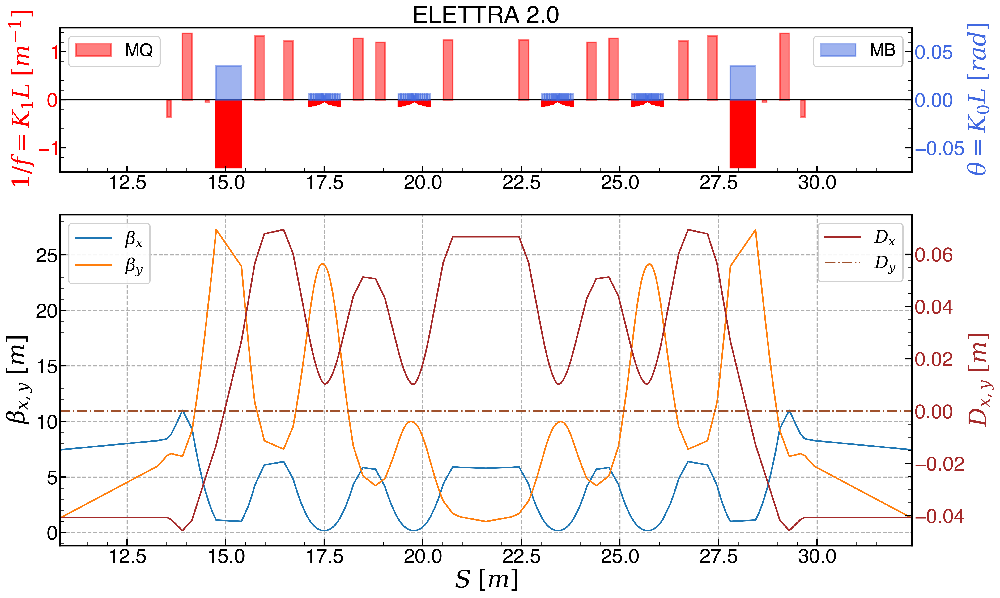

In [21]:
# Let's have a look...

s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

Dispersion is back to crap in the LL... Shall we rematch with BQF1/2?

In [22]:
# Dispersion matching using the AB

madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf1, step=1e-6;
vary, name=k1_bqf2, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

print(madx.globals.tar)

1.5626143345799263e-07


2021-10-22 15:10:45.894 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:10:45.895 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:10:46.357 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:10:46.418 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:10:47.869 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:10:47.886 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:10:47.909 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


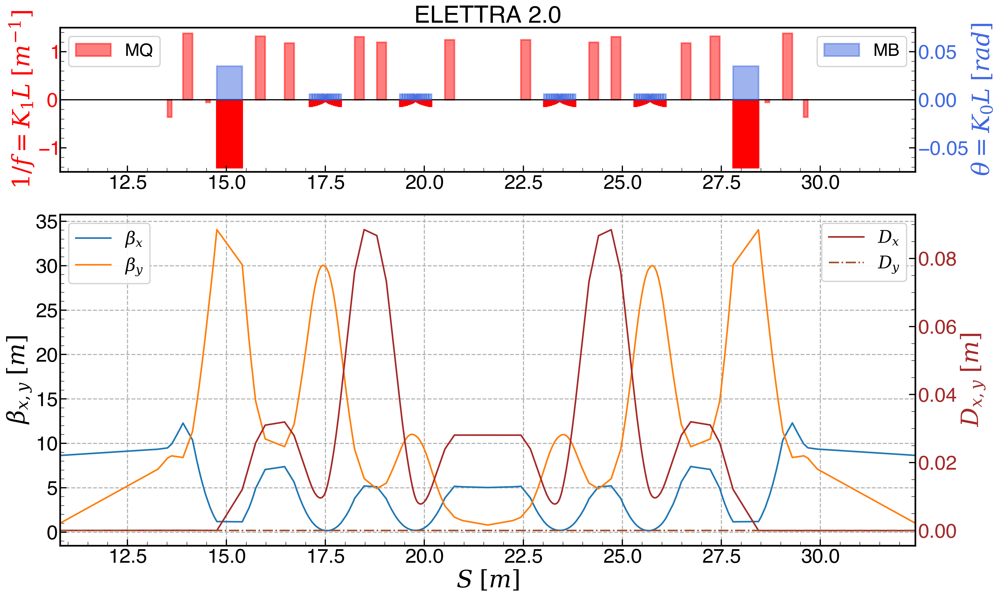

In [23]:
# Let's have a look...

s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [25]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1241.7546 pm


Now we can try the otehr way around: scan BQF1/2, and match with the two others...

In [26]:
madx.globals.k1_bqf1

4.91403095668113

In [27]:
# And let's scan BQF1

init_k1_bqf1 = 4.912771939816855
delta_k1_bqf1 = 1
n_points = 100

k1_bqf1_scan = ScanConfig("k1_bqf1", initial_value=init_k1_bqf1, scan_start=init_k1_bqf1-delta_k1_bqf1, 
                         scan_end=init_k1_bqf1+delta_k1_bqf1, n_points=n_points)

In [28]:
%%time
emit_res = elettra_toolbox.scan_param_for_emittance(madx, k1_bqf1_scan, 'stdout.out')

Scanning parameter k1_bqf1 for emittance results.
Attempting emittance calculation for value of 3.91277
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 3.93297
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 3.95318
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 3.97338
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 3.99358
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.01378
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.03398
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.07439
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.09459
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.11479
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.13499
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.15520


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.17540
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.19560
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.21580
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.23600


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.25621
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.27641
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.29661
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.31681


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.33701
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.35722
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.37742
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.39762


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.41782
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.43802
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.45823
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.47843


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.49863
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.51883
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.53903
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.55924


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.57944
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.59964
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.61984
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.64004


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.66025
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.68045
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.70065
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.72085


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.74105
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.76126
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 4.78146


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.80166
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.82186
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.84206
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.86227
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.88247
Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])
Attempting emittance calculation for value of 4.90267
Running survey on the machine
Machine seems closed with respect to the

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.56934
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.58954
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.60974


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.62994
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.65015
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.67035
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.69055
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.71075
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.73095
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.75116


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.77136
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.79156
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.81176
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.83196
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.85217
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.87237
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance calculation for value of 5.89257
Twiss failed for this configuration, defaulting to NaN and skipping ahead.
Attempting emittance c

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
++++++ E

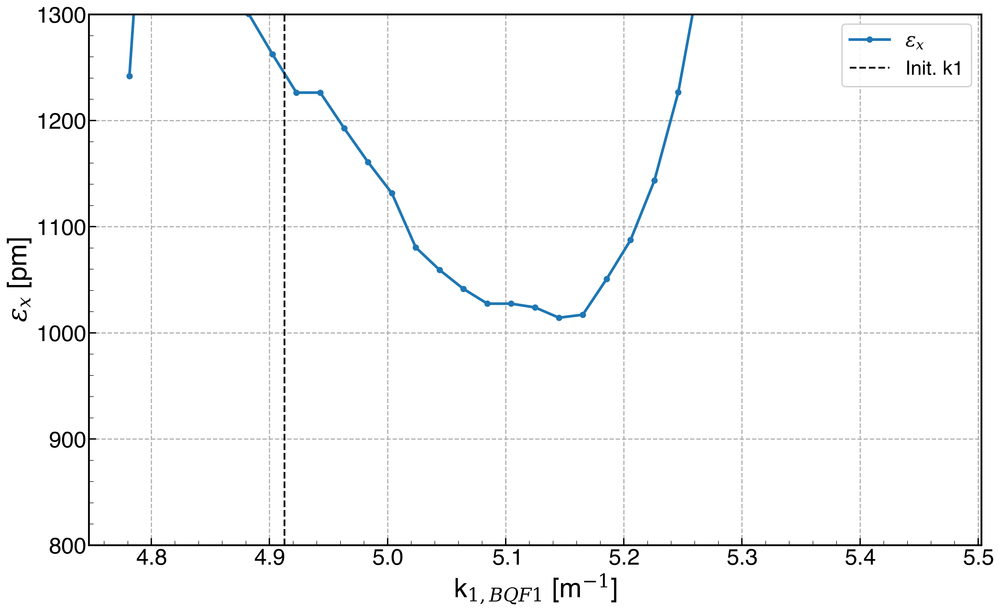

In [29]:
plt.plot(emit_res.index.to_numpy(), emit_res['ex']*1e12, '-o', lw=3, label='$\\epsilon_x$')
plt.axvline(x=init_k1_bqf1, ls='--', c='k', lw=2, label='Init. k1')
plt.legend(loc='best')
plt.ylim(800,1300)
plt.xlabel('k$_{1, BQF1}$ [m$^{-1}$]')
plt.ylabel('$\\epsilon_x$ [pm]');

Yeah that tells us to come back to the initial value... 

In [30]:
# Let's set k1_bqf1 for the best emittance value

madx.globals.k1_bqf1 = emit_res['ex'].idxmin()
madx.command.twiss()
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine
Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

2021-10-22 15:11:33.265 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:11:33.266 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:11:33.740 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:11:33.802 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:11:35.202 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:11:35.225 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:11:35.246 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


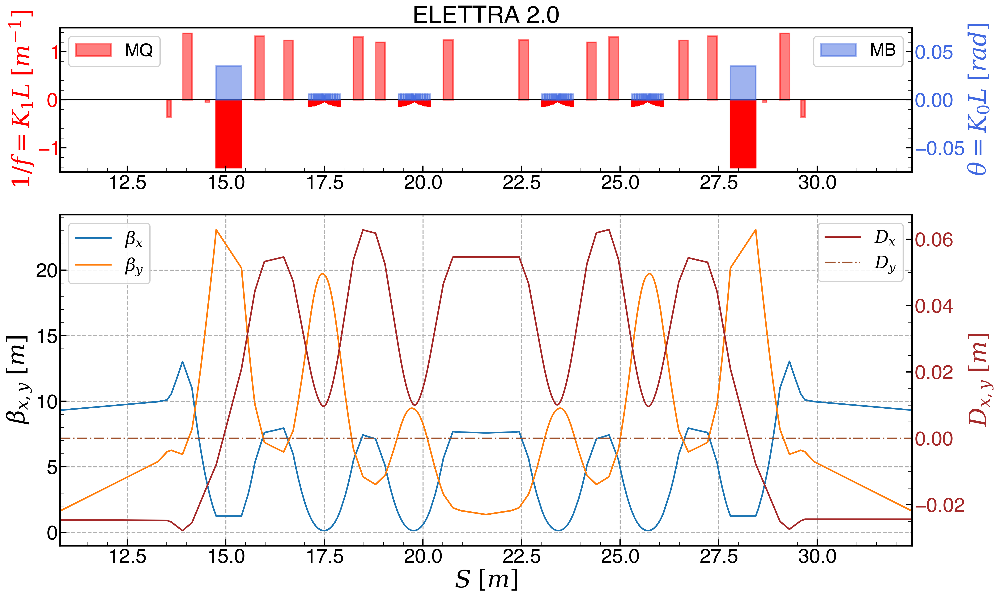

In [31]:
# Let's have a look...

s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [32]:
# Let's match the LL with bqf3/4

# Dispersion matching using the AB

madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=3000, tolerance=1e-21;
endmatch;


"""
)

print(madx.globals.tar)

1.5778547223261804e-23


2021-10-22 15:11:42.716 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:11:42.718 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:11:43.179 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:11:43.245 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:11:44.584 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:11:44.600 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:11:44.621 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


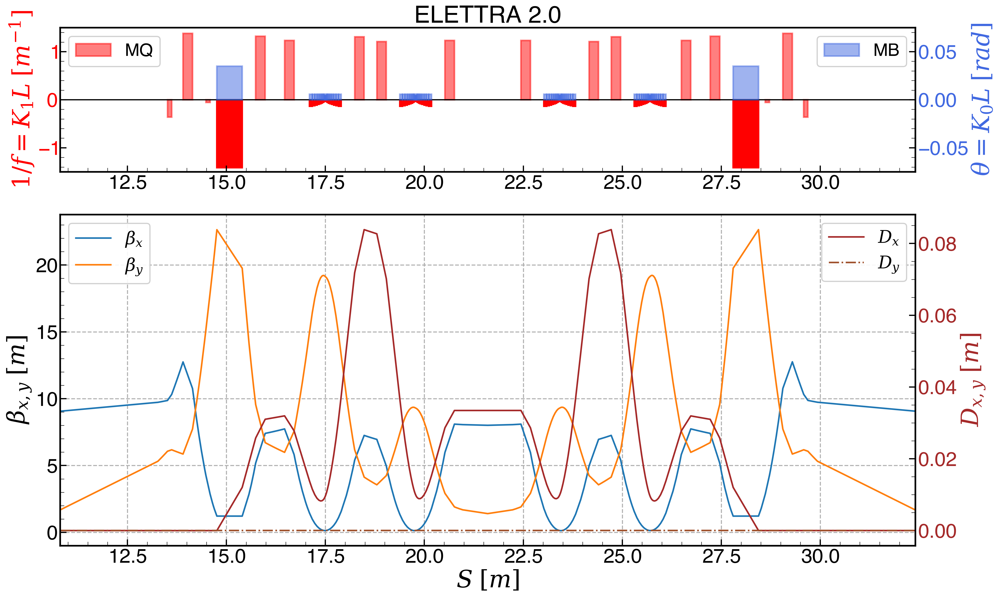

In [33]:
# Let's have a look...

s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

Same problem... We push the dispersion down in the LL, and we get a bump... Let's start from scratch and try the other way around 

---

In [58]:
madx.quit()

In [59]:
if os.path.exists("stdout.out"):
    os.remove("stdout.out")

# Launch MAD-X Session
with open("stdout.out", "w") as f:
    madx = Madx(stdout=f)

# Read parameters

from config import parameters, settings

for i in parameters.keys():
    madx.globals[i] = parameters[i]

# Call sequence and optics

madx.call("elettra2_v15_VADER_2.3T.madx")
madx.call("optics_elettra2_v15_VADER_2.3T.madx")

# Initial twiss

madx.use(sequence="ring")
madx.twiss(sequence="ring", table="init_twiss")

# Compute Emittance

madx.input(
    f"""
emit, deltap={madx.globals.deltap};
emit, deltap={madx.globals.deltap};
"""
)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

twiss = madx.table.init_twiss.dframe()


# Let's install some markers

madx.input(
    """
left_marker: marker;
right_marker: marker;
middle_marker: marker;

use, sequence=ring;
seqedit, sequence=ring;
flatten;
install, element=left_marker, at=10.8;
install, element=middle_marker, at=21.6;
install, element=right_marker, at=32.4;
flatten;
endedit;
"""
)

madx.use(sequence="ring")
madx.twiss(sequence="ring")
twiss = madx.table.twiss.dframe()

Emittance x : 1031.9436 pm


In [60]:
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

2021-10-22 15:20:13.515 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:20:13.516 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:20:13.997 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:20:14.058 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:20:15.292 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:20:15.311 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:20:15.330 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate
2021-10-22 15:20:15.332 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:695 - Savin

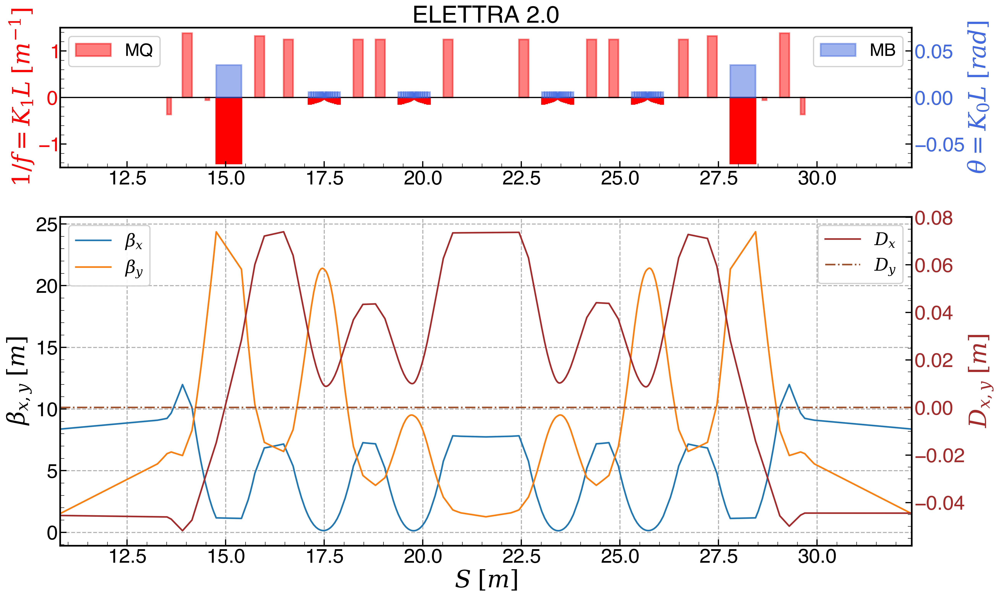

In [61]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
    savefig="raw_no_AB.pdf",
)

In [62]:
# Dispersion matching using the AB

madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

print(madx.globals.tar)

3.4454108061461635e-19


2021-10-22 15:20:23.862 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:20:23.863 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:20:24.336 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:20:24.401 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:20:25.838 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:20:25.853 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:20:25.872 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


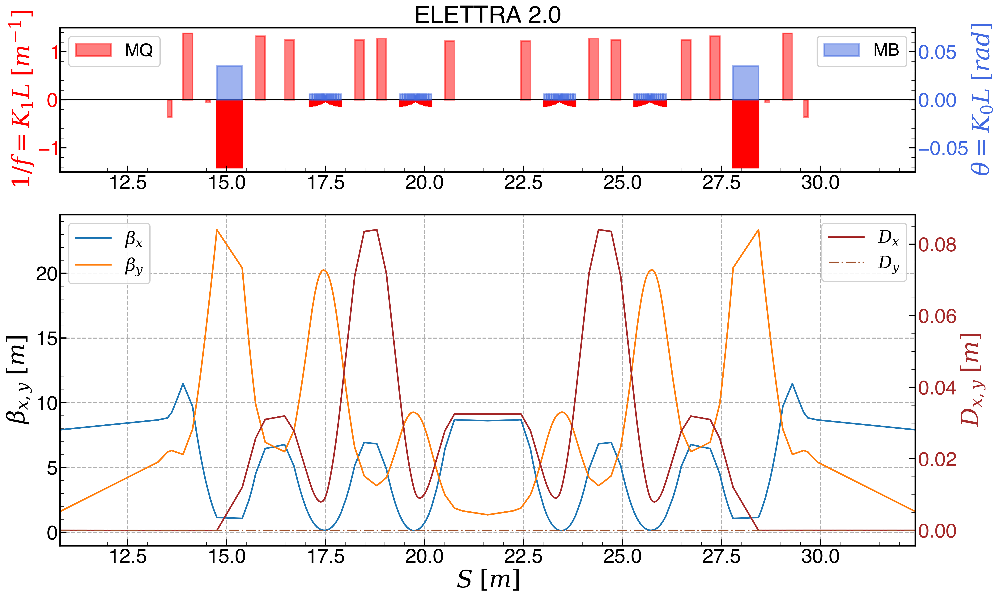

In [63]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [64]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 1211.6831 pm


In [65]:
# Scan BQF1

init_k1_bqf1 = 5.191616161616161
delta_k1_bqf1 = 2
n_points = 200

k1_bqf1_scan = ScanConfig("k1_bqf1", initial_value=init_k1_bqf1, scan_start=init_k1_bqf1-delta_k1_bqf1, 
                         scan_end=init_k1_bqf1+delta_k1_bqf1, n_points=n_points)

In [66]:
%%time
emit_res = elettra_toolbox.scan_param_for_emittance(madx, k1_bqf1_scan, 'stdout.out')

Scanning parameter k1_bqf1 for emittance results.


INFO:elettra_toolbox:Scanning parameter k1_bqf1 for emittance results.


Attempting emittance calculation for value of 3.19162


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.19162


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.21172


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.21172


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.23182


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.23182


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.25192


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.25192


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.27202


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.27202


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.29212


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.29212


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.31222


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.31222


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.33232


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.33232


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.35242


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.35242


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.37252


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.37252


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.39262


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.39262


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.41272


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.41272


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.43282


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.43282


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.45292


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.45292


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.47302


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.47302


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.49312


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.49312


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.51322


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.51322


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.53332


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.53332


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.55343


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.55343


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.57353


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.57353


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.59363


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.59363


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.61373


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.61373


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.63383


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.63383


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.65393


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.65393


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.67403


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.67403


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.69413


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.69413


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.71423


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.71423


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.73433


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.73433


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.75443


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.75443


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.77453


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.77453


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.79463


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.79463


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.81473


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.81473


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.83483


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.83483


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.85493


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.85493


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.87503


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.87503


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.89513


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.89513


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.91523


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.91523


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.93533


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.93533


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.95544


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.95544


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.97554


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.97554


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.99564


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.99564


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.01574


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.01574


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.03584


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.03584
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.05594


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.05594
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.07604


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.07604


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.09614


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.09614


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.11624


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.11624


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.13634


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.13634


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.15644


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.15644


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.17654


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.17654


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.19664


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.19664


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.21674


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.21674


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.23684


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.23684


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.25694


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.25694


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.27704


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.27704


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.29714


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.29714


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.31724


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.31724


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.33734


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.33734


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.35745


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.35745


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.37755


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.37755


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.39765


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.39765


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.41775


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.41775


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.43785


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.43785


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.45795


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.45795


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.47805


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.47805


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.49815


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.49815


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.51825


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.51825


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.53835


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.53835


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.55845


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.55845


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.57855


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.57855


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.59865


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.59865


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.61875


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.61875


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.63885


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.63885


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.65895


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.65895


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.67905


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.67905


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.69915


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.69915


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.71925


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.71925


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.73935


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.73935


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.75946


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.75946


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.77956


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.77956


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.79966


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.79966


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.81976


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.81976


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.83986


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.83986


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.85996


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.85996


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.88006


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.88006


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.90016


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.90016


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.92026


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.92026


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.94036


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.94036


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.96046


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.96046


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.98056


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.98056


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.00066


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.00066


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.02076


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.02076


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.04086


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.04086


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.06096


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.06096


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.08106


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.08106


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.10116


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.10116


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.12126


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.12126


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.14136


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.14136


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.16147


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.16147


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.18157


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.18157


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.20167


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.20167


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.22177


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.22177


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.24187


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.24187


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.26197


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.26197


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.28207


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.28207


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.30217


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.30217


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.32227


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.32227


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.34237


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.34237


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.36247


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.36247


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.38257


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.38257


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.40267


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.40267


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.42277


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.42277


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.44287


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.44287


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.46297


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.46297


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.48307


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.48307


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.50317


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.50317


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.52327


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.52327


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.54337


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.54337


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.56348


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.56348


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.58358


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.58358


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.60368


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.60368


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.62378


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.62378


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.64388


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.64388


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.66398


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.66398


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.68408


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.68408


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.70418


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.70418


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.72428


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.72428


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.74438


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.74438


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.76448


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.76448


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.78458


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.78458


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.80468


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.80468


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.82478


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.82478


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.84488


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.84488


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.86498


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.86498


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.88508


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.88508


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.90518


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.90518


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.92528


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.92528


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.94539


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.94539


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.96549


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.96549


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.98559


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.98559


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.00569


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.00569


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.02579


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.02579


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.04589


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.04589


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.06599


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.06599


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.08609


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.08609


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.10619


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.10619


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.12629


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.12629


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.14639


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.14639


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.16649


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.16649


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.18659


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.18659


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.20669


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.20669


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.22679


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.22679


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.24689


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.24689


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.26699


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.26699


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.28709


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.28709


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.30719


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.30719


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.32729


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.32729


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.34740


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.34740


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.36750


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.36750


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.38760


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.38760
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.40770


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.40770


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.42780


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.42780


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.44790


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.44790
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.46800


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.46800


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.48810


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.48810


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.50820


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.50820


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.52830


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.52830


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.54840


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.54840
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.56850


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.56850
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.58860


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.58860


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.60870


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.60870


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.62880


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.62880


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.64890


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.64890


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.66900


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.66900


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.68910


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.68910


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.70920


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.70920


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.72930


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.72930


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.74941


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.74941
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.76951


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.76951


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.78961


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.78961


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.80971


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.80971


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.82981


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.82981


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.84991


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.84991


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.87001


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.87001


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.89011


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.89011


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.91021


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.91021


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.93031


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.93031


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.95041


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.95041


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.97051


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.97051


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.99061


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.99061


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.01071


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.01071


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.03081


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.03081


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.05091


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.05091


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.07101


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.07101


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.09111


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.09111


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.11121


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.11121


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.13131


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.13131


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.15142


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.15142


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.17152


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.17152


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.19162


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.19162


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


CPU times: user 795 ms, sys: 224 ms, total: 1.02 s
Wall time: 16.7 s


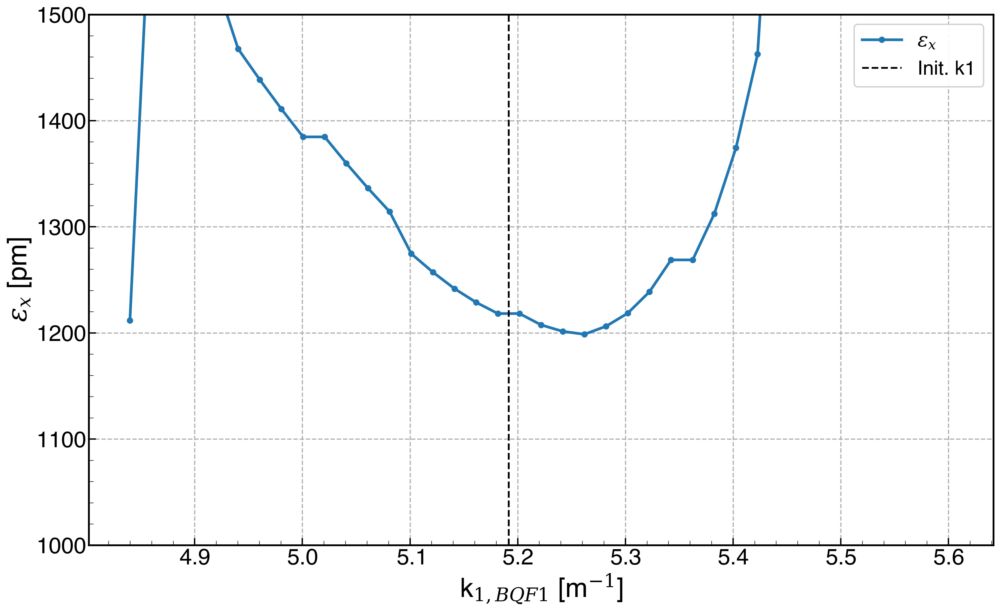

In [67]:
plt.plot(emit_res.index.to_numpy(), emit_res['ex']*1e12, '-o', lw=3, label='$\\epsilon_x$')
plt.axvline(x=init_k1_bqf1, ls='--', c='k', lw=2, label='Init. k1')
plt.legend(loc='best')
plt.ylim(1000,1500)
plt.xlabel('k$_{1, BQF1}$ [m$^{-1}$]')
plt.ylabel('$\\epsilon_x$ [pm]');

In [68]:
# No impact, set back to initiati value

madx.globals.k1_bqf1 = init_k1_bqf1
madx.command.twiss()
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

In [69]:
# And let's scan BQF2

init_k1_bqf2 = 5.191616161616161
delta_k1_bqf2 = 2
n_points = 200

k1_bqf2_scan = ScanConfig("k1_bqf2", initial_value=init_k1_bqf2, scan_start=init_k1_bqf2-delta_k1_bqf2, 
                         scan_end=init_k1_bqf2+delta_k1_bqf2, n_points=n_points)

In [70]:
%%time
emit_res = elettra_toolbox.scan_param_for_emittance(madx, k1_bqf2_scan, 'stdout.out')

Scanning parameter k1_bqf2 for emittance results.


INFO:elettra_toolbox:Scanning parameter k1_bqf2 for emittance results.


Attempting emittance calculation for value of 3.19162


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.19162


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.21172


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.21172


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.23182


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.23182


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.25192


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.25192


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.27202


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.27202


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.29212


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.29212


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.31222


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.31222


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.33232


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.33232


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.35242


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.35242


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.37252


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.37252


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.39262


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.39262


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.41272


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.41272


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.43282


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.43282


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.45292


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.45292


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.47302


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.47302


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.49312


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.49312


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.51322


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.51322


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.53332


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.53332


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.55343


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.55343


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.57353


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.57353


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.59363


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.59363


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.61373


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.61373


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.63383


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.63383


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.65393


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.65393


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.67403


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.67403


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.69413


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.69413


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.71423


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.71423


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.73433


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.73433


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.75443


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.75443


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.77453


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.77453


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.79463


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.79463


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.81473


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.81473


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.83483


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.83483


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.85493


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.85493


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.87503


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.87503


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.89513


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.89513


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.91523


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.91523


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.93533


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.93533


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.95544


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.95544


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.97554


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.97554


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 3.99564


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 3.99564


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.01574


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.01574


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.03584


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.03584


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.05594


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.05594


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.07604


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.07604


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.09614


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.09614


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.11624


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.11624


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.13634


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.13634


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.15644


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.15644


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.17654


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.17654


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.19664


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.19664


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.21674


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.21674


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.23684


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.23684


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.25694


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.25694


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.27704


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.27704


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.29714


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.29714


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.31724


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.31724


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.33734


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.33734


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.35745


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.35745


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.37755


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.37755


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.39765


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.39765


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.41775


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.41775


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.43785


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.43785


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.45795


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.45795


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.47805


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.47805


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.49815


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.49815


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.51825


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.51825


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.53835


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.53835


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.55845


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.55845


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.57855


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.57855


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.59865


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.59865


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.61875


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.61875


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.63885


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.63885


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.65895


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.65895


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.67905


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.67905


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.69915


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.69915


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 4.71925


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.71925


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.73935


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.73935


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.75946


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.75946


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.77956


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.77956


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.79966


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.79966


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.81976


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.81976


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.83986


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.83986


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.85996


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.85996


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.88006


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.88006


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.90016


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.90016


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.92026


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.92026


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.94036


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.94036


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.96046


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.96046


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 4.98056


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 4.98056


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.00066


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.00066


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.02076


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.02076


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.04086


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.04086


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.06096


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.06096


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.08106


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.08106


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.10116


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.10116


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.12126


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.12126


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.14136


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.14136


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.16147


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.16147


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.18157


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.18157


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.20167


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.20167


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.22177


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.22177


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.24187


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.24187


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.26197


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.26197


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.28207


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.28207


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.30217


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.30217


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.32227


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.32227


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.34237


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.34237


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.36247


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.36247


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.38257


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.38257


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.40267


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.40267


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.42277


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.42277


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.44287


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.44287


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.46297


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.46297


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.48307


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.48307


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.50317


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.50317


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.52327


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.52327


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of 5.54337


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.54337


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.56348


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.56348


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.58358


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.58358


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.60368


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.60368


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.62378


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.62378


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.64388


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.64388


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.66398


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.66398


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.68408


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.68408


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.70418


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.70418


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.72428


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.72428


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.74438


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.74438


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.76448


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.76448


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.78458


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.78458


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.80468


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.80468
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.82478


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.82478


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.84488


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.84488


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.86498


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.86498


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.88508


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.88508


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.90518


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.90518


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.92528


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.92528


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.94539


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.94539


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.96549


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.96549


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 5.98559


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 5.98559


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.00569


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.00569


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.02579


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.02579


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.04589


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.04589


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.06599


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.06599


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.08609


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.08609


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.10619


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.10619


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.12629


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.12629


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.14639


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.14639


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.16649


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.16649


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.18659


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.18659


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.20669


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.20669


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.22679


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.22679


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.24689


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.24689


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.26699


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.26699


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.28709


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.28709


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.30719


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.30719


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.32729


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.32729


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.34740


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.34740


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.36750


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.36750


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.38760


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.38760


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.40770


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.40770


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.42780


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.42780


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.44790


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.44790


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.46800


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.46800
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.48810


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.48810
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.50820


++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.50820


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.52830


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.52830


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.54840


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.54840
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.56850


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.56850
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.58860


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.58860


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.60870


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.60870
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.62880


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.62880
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.64890


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.64890


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.66900


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.66900


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.68910


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.68910
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.70920


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.70920


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.72930


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.72930
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.74941


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.74941
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.76951


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.76951
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.78961


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.78961


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.80971


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.80971
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.82981


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.82981


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.84991


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.84991
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.87001


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.87001
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.89011


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.89011
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:

Twiss failed for this configuration, defaulting to NaN and skipping ahead.



++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.91021


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.91021
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.93031


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.93031
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.95041


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.95041
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.97051


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.97051


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 6.99061


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 6.99061
++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.01071


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.01071


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.03081


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.03081


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.05091


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.05091


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.07101


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.07101


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.09111


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.09111


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.11121


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.11121


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.13131


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.13131


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.15142


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.15142


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.17152


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.17152


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of 7.19162


DEBUG:elettra_toolbox:Attempting emittance calculation for value of 7.19162


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:elettra_toolbox:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


CPU times: user 861 ms, sys: 256 ms, total: 1.12 s
Wall time: 18.7 s


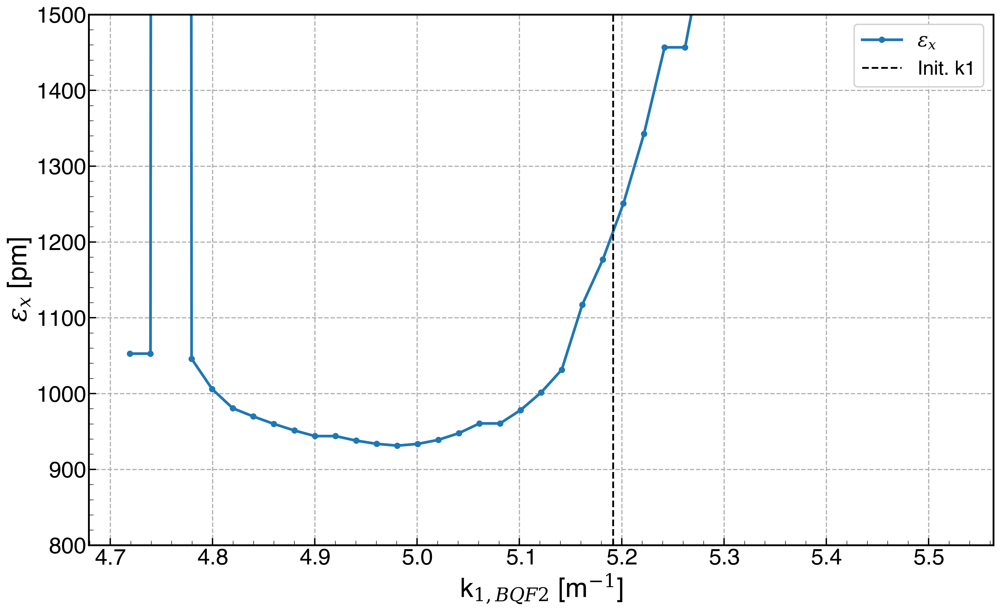

In [71]:
plt.plot(emit_res.index.to_numpy(), emit_res['ex']*1e12, '-o', lw=3, label='$\\epsilon_x$')
plt.axvline(x=init_k1_bqf2, ls='--', c='k', lw=2, label='Init. k1')
plt.legend(loc='best')
plt.ylim(800,1500)
plt.xlabel('k$_{1, BQF2}$ [m$^{-1}$]')
plt.ylabel('$\\epsilon_x$ [pm]');

Let's choose 5 

In [72]:
# Set to 5

madx.globals.k1_bqf2 = 5
madx.command.twiss()
elettra_toolbox.check_closed_machine(madx)

Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


(4.4663570802525135e-09, 0.0006081562312737487)

In [73]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 933.4588500000001 pm


2021-10-22 15:21:15.451 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:21:15.452 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:21:15.920 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:21:15.987 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:21:17.223 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:21:17.245 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:21:17.269 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


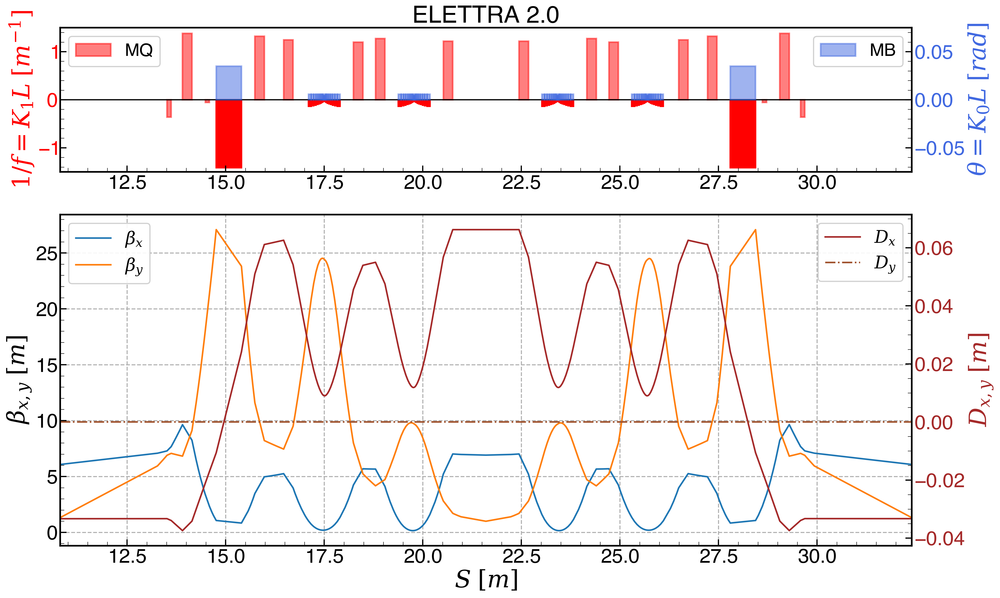

In [74]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

2021-10-22 15:21:20.667 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 15:21:20.668 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 15:21:21.170 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 15:21:21.241 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 15:21:22.751 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 15:21:22.766 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 15:21:22.787 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


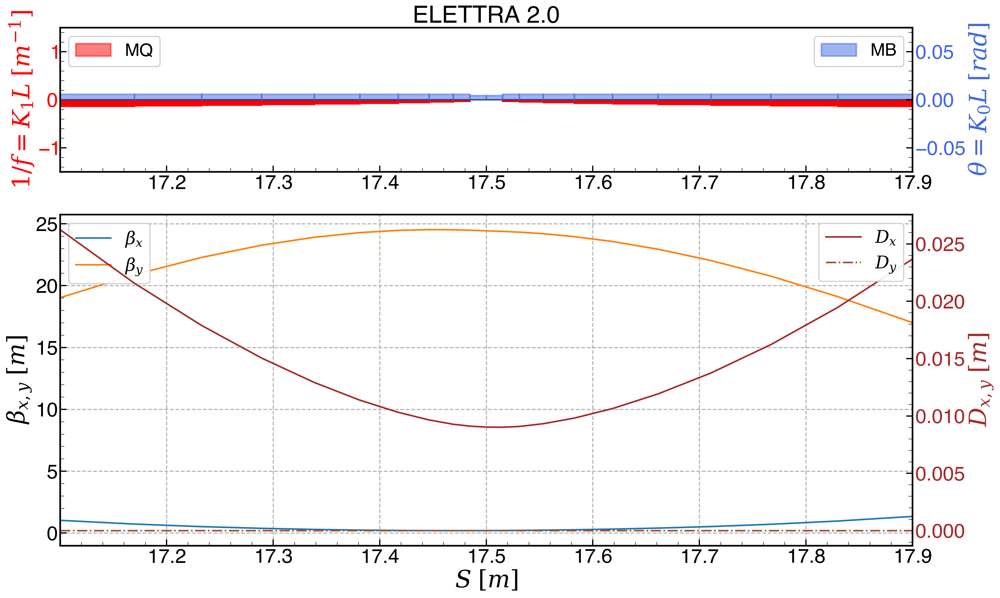

In [75]:
s_start = twiss[twiss.name == "vader9:5"]["s"][0]-0.06982327
s_end = twiss[twiss.name == "vader9:6"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [76]:
from cpymad.madx import TwissFailed
import gc

In [117]:
%%time
initial_k1_qd1 = -3.42
initial_k1_qf1 = 5.753095265309118
initial_k1_qd2 = -0.53
initial_k1_qf2 = 5.499568132626244

delta_max = 1e-1
n_points = 51
delta_scan = np.linspace(-delta_max, delta_max, n_points)

emit_res_df = pd.DataFrame(index=delta_scan, columns=delta_scan)

# The idea is to scan in parallel the QF and QD with the same values: 
# Note, index is the QF, columns are the QD

for delta_qf in delta_scan:
    for delta_qd in delta_scan:
        LOGGER.debug(f"Attempting emittance calculation for value of DELTA QF = {delta_qf:.5f} and DELTA QD = {delta_qd:.5f}")
        # set the QF
        madx.globals.k1_qf1 = initial_k1_qf1 + delta_qf
        madx.globals.k1_qf2 = initial_k1_qf2 + delta_qf
        
        # set the QD
        madx.globals.k1_qd1 = initial_k1_qd1 + delta_qd
        madx.globals.k1_qd2 = initial_k1_qd2 + delta_qd
        
        try:
            LOGGER.debug("Attempt TWISS...")
            madx.twiss()
            elettra_toolbox.check_closed_machine(madx, tol=1e-3)
            madx.command.emit(deltap=madx.globals.deltap)
            madx.command.emit(deltap=madx.globals.deltap)
            madx.command.emit(deltap=madx.globals.deltap)
            ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output(madx_output_file='stdout.out', to_meters=True)
            emit_res_df.loc[delta_qf, delta_qd] = ex
        except TwissFailed:
            LOGGER.debug("Twiss failed for this configuration, defaulting to NaN and skipping ahead.")
            emit_res_df.loc[delta_qf, delta_qd] = np.nan
        except AssertionError:
            LOGGER.debug("Machine not closed for this configuration, defaulting to NaN and skipping ahead.")
            emit_res_df.loc[delta_qf, delta_qd] = np.nan
        gc.collect()




Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.10000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.09200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.08000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.07200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.06000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.05200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.04000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.03200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.02000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.01200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = -0.00400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.00800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.01600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.02800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.03600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.04800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.05600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.06800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.07600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08400 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.08800 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09200 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Twiss failed for this configuration, defaulting to NaN and skipping ahead.


++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed
DEBUG:__main__:Twiss failed for this configuration, defaulting to NaN and skipping ahead.


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.09600 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = -0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.00800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.01200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.01200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.01600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.01600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.02800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.03200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.03200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.03600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.03600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.04800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.05200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.05200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.05600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.05600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.06800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.07200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.07200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.07600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.07600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08400


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08400


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08800


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.08800


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.09200


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.09200


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.09600


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.09600


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.10000


DEBUG:__main__:Attempting emittance calculation for value of DELTA QF = 0.10000 and DELTA QD = 0.10000


Attempt TWISS...


DEBUG:__main__:Attempt TWISS...


Running survey on the machine


DEBUG:elettra_toolbox:Running survey on the machine


Machine seems closed with respect to the provided tolerance (1.0 [mm])


INFO:elettra_toolbox:Machine seems closed with respect to the provided tolerance (1.0 [mm])


CPU times: user 24min 22s, sys: 1min 17s, total: 25min 40s
Wall time: 39min 33s


In [83]:
import seaborn as sns

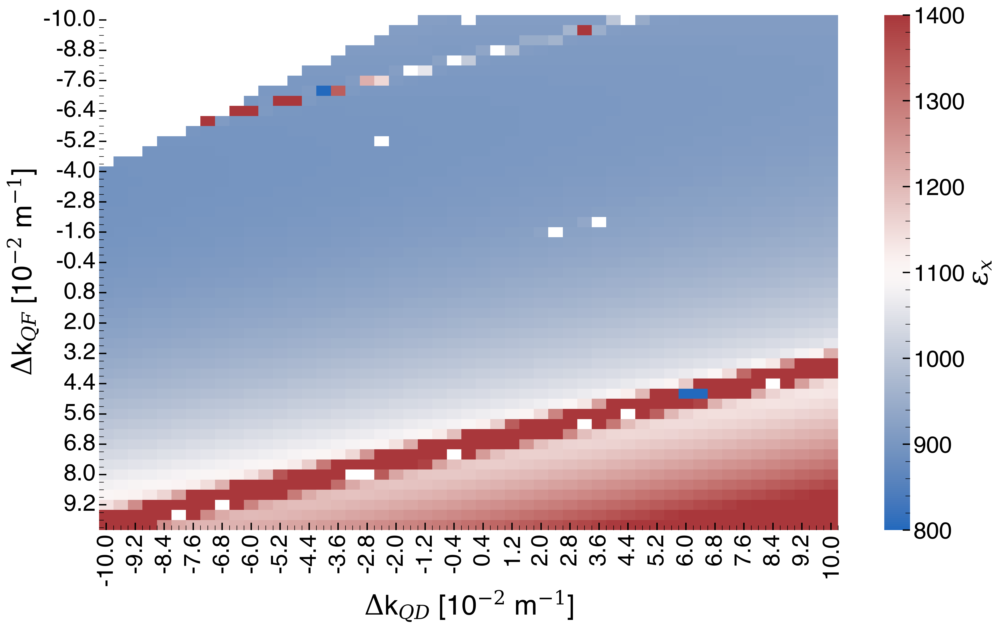

In [184]:
fig = sns.heatmap(data=emit_res_df.astype(float)*1e12, vmin=800, vmax=1400, cmap='vlag',
                 cbar_kws={'label': '$\\epsilon_x$'})
fig.set_xticklabels([round(x*1e2,1) for x in [float(fig.get_xmajorticklabels()[i].get_text()) for i in range(len(fig.get_xmajorticklabels()))]])
fig.set_yticklabels([round(x*1e2,1) for x in [float(fig.get_ymajorticklabels()[i].get_text()) for i in range(len(fig.get_ymajorticklabels()))]])
fig.set_ylabel('$\\Delta$k$_{QF}$ [10$^{-2}$ m$^{-1}$]');
fig.set_xlabel('$\\Delta$k$_{QD}$ [10$^{-2}$ m$^{-1}$]');

#plt.savefig('emit_scan_qf_qd.pdf', bbox_inches='tight')

In [159]:
emit_res_df.to_pickle('emit_res_qf_qf_scan.pkl')

In [163]:
emit_res_df.to_numpy().min()

9.093398499999999e-10

In [185]:
delta_qd_opt = -0.1
delta_qf_opt = -0.04

In [186]:
opt_k1_qf1 = initial_k1_qf1 + delta_qf_opt
opt_k1_qd1 = initial_k1_qd1 + delta_qd_opt
opt_k1_qf2 = initial_k1_qf2 + delta_qf_opt
opt_k1_qd2 = initial_k1_qd2 + delta_qd_opt

In [187]:
# set the QF
madx.globals.k1_qf1 = opt_k1_qf1
madx.globals.k1_qf2 = opt_k1_qf2

# set the QD
madx.globals.k1_qd1 = opt_k1_qd1
madx.globals.k1_qd2 = opt_k1_qd2

In [188]:
madx.command.twiss()

True

In [189]:
madx.twiss(sequence='ring', table='opt_twiss');

In [190]:
opt_twiss = madx.table.opt_twiss.dframe()

In [191]:
# Compute Emittance

madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)
madx.command.emit(deltap=madx.globals.deltap)

# Get the emittance from the standard output

ex, ey, ez = elettra_toolbox.get_emittances_from_madx_output("stdout.out", to_meters=True)


print(f"Emittance x : {ex*1e12} pm")

Emittance x : 893.28902 pm


2021-10-22 17:30:12.058 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 17:30:12.065 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 17:30:12.537 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 17:30:12.627 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 17:30:15.446 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 17:30:15.464 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 17:30:15.486 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


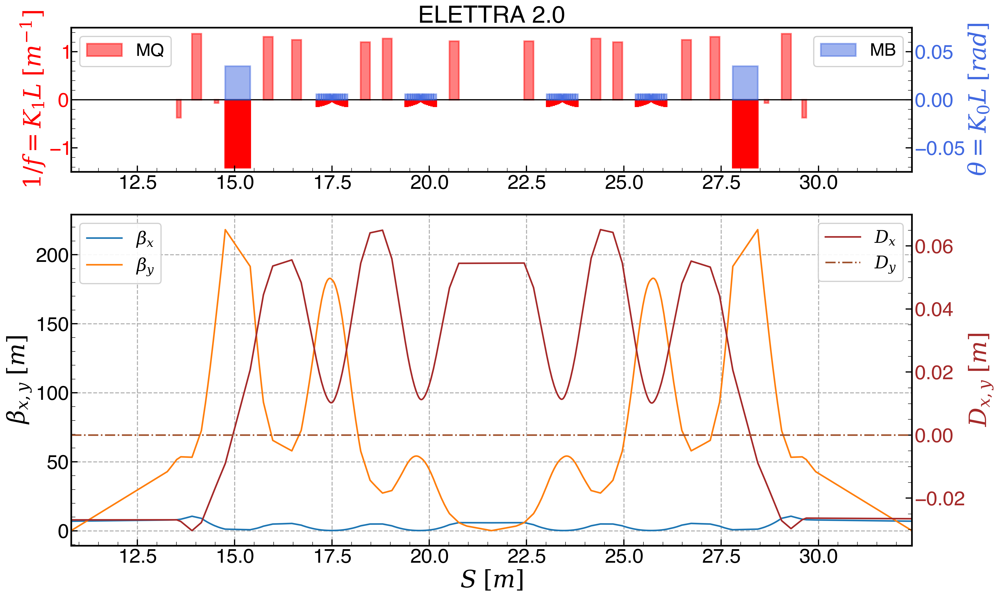

In [192]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)

In [193]:
# Dispersion matching using the AB

madx.input(
    """
match, sequence=ring;
vary, name=k1_bqf3, step=1e-6;
vary, name=k1_bqf4, step=1e-6;
constraint, range=ll[1], dx=0, dy=0;
constraint, range=ll[3], dx=0, dy=0;
lmdif, calls=1000, tolerance=1e-21;
endmatch;


"""
)

print(madx.globals.tar)

++++++ Error: seterrorflag : Errorcode: 1   Reported from pro_twiss:
++++++ Error: seterrorflag : Description: TWISS failed


1.829719391031167e-07


2021-10-22 17:31:01.620 | INFO     | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:638 - Plotting optics functions and machine layout
2021-10-22 17:31:01.621 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:639 - Getting Twiss dataframe from cpymad
2021-10-22 17:31:02.097 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_make_elements_groups:1319 - Getting different element groups dframes from MAD-X twiss table
2021-10-22 17:31:02.160 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:_plot_machine_layout:1191 - Plotting machine layout
2021-10-22 17:31:03.300 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:665 - Plotting beta functions
2021-10-22 17:31:03.317 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:673 - Plotting dispersion functions
2021-10-22 17:31:03.337 | DEBUG    | pyhdtoolkit.cpymadtools.plotters:plot_latwiss:691 - Setting xlim for longitudinal coordinate


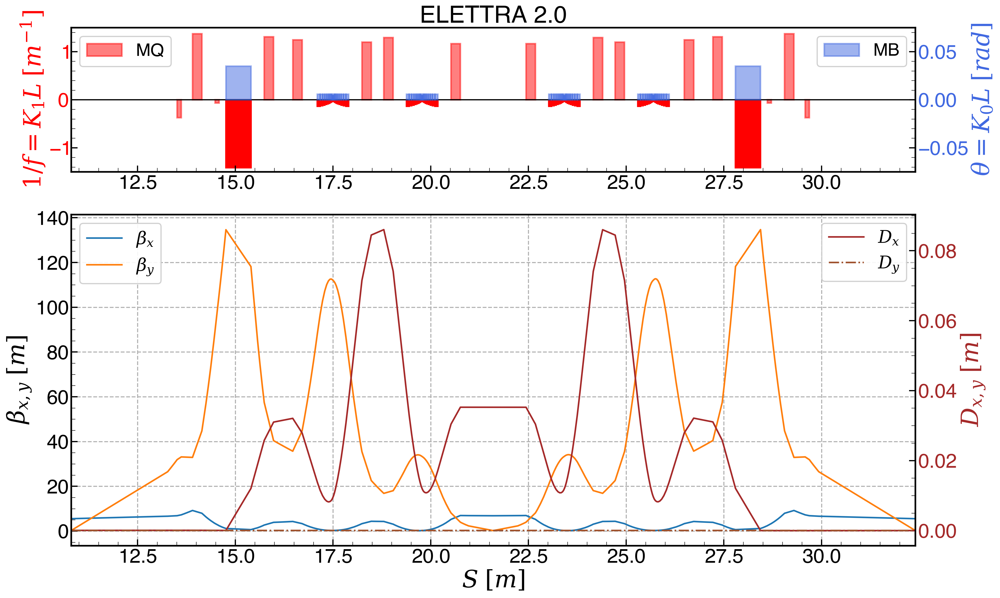

In [194]:
s_start = twiss[twiss.name == "left_marker:1"]["s"][0]
s_end = twiss[twiss.name == "right_marker:1"]["s"][0]

fig_lattice = cpymadtools.plotters.LatticePlotter.plot_latwiss(
    madx=madx,
    title="ELETTRA 2.0",
    xlimits=(s_start, s_end),
    disp_ylim=None,
    k0l_lim=(-75 * 1e-3, 75 * 1e-3),
    k1l_lim=(-1.5, 1.5),
    plot_dipole_k1=True,
    lw=2,
)